# FGSM & iFGSM & C&W Attack (Local WSL Version)

In [18]:

import sys
import os
import torch
import hashlib
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from torchvision import datasets, transforms
from torch.utils.data import TensorDataset, DataLoader

# 將本地路徑加入 sys.path 以載入自定義模組
sys.path.append(os.path.abspath('./mnist'))

from fgsm_attack import FGSMAttack, SparseFGSMAttack
from ifgsm_attack import IFGSMAttack 
from cw_attack import CWAttack
from models.mnist_net import mnistNet

In [2]:
def get_device():
    """取得最佳運算裝置 (CUDA 或 CPU)"""
    return torch.device("cuda" if torch.cuda.is_available() else "cpu")

def load_model(model_path, device):
    """載入模型與權重"""
    print(f"Loading model from {model_path}...")
    model = mnistNet().to(device)
    if os.path.exists(model_path):
        model.load_state_dict(torch.load(model_path, map_location=device))
        print("Model loaded successfully.")
    else:
        print("Warning: Model file not found, using uninitialized weights.")
    model.eval()
    return model

def get_test_dataloader(data_path='./mnist/data', batch_size=512):
    """載入 MNIST 測試集並優化傳輸效能"""
    t = transforms.Compose([transforms.ToTensor()])
    dataset = datasets.FashionMNIST(data_path, train=False, download=True, transform=t)
    
    dataloader = torch.utils.data.DataLoader(
        dataset, 
        batch_size=batch_size, 
        num_workers=4,      # 使用 4 個 CPU 線程準備數據
        pin_memory=True,    # 加速將數據從記憶體搬移到 GPU 顯存
        shuffle=False
    )
    return dataloader

def run_attack(attack_class, model, epsilons, dataloader, device, target=None, **kwargs):
    """執行指定的對抗樣本攻擊"""
    print(f"\n--- Running {attack_class.__name__} ---")
    attack = attack_class(model, epsilons, dataloader, device, target=target, **kwargs)
    attack.run()
    return attack




# 建立 Fashion MNIST 的標籤對應表
FASHION_LABELS = {
    0: 'T-shirt/top',
    1: 'Trouser',
    2: 'Pullover',
    3: 'Dress',
    4: 'Coat',
    5: 'Sandal',
    6: 'Shirt',
    7: 'Sneaker',
    8: 'Bag',
    9: 'Ankle boot'
}

def visualize_results(attack):
    """繪製成功率與對抗樣本 (支援 Fashion MNIST 文字標籤)"""
    # 1. 繪製成功率折線圖 (維持原樣)
    attack.plot_success_rate()
    
    # 2. 重新定義對抗樣本的視覺化邏輯
    plt.figure(figsize=(15, 12)) # 稍微加大畫布以容納文字
    cnt = 0
    
    for eps, adv_examples in attack.adv_examples.items():
        for index, data in enumerate(adv_examples[:5]):
            cnt += 1
            plt.subplot(len(attack.epsilons), 5, cnt)
            plt.xticks([], [])
            plt.yticks([], [])
            
            if index == 0:
                plt.ylabel(f"Eps: {eps}", fontsize=14)
            
            orig_lbl, adv_lbl, adv_ex, orig_ex = data
            
            # 將數字轉換為文字
            orig_name = FASHION_LABELS.get(orig_lbl, str(orig_lbl))
            adv_name = FASHION_LABELS.get(adv_lbl, str(adv_lbl))
            
            separator = np.ones((28, 2))
            combined_img = np.concatenate((orig_ex, separator, adv_ex), axis=1)
            
            # 將標題換成服飾名稱 (使用換行 \n 避免文字太長重疊)
            plt.title(f"{orig_name}\n-> {adv_name}", fontsize=11)
            plt.imshow(combined_img, cmap="gray")
            
        cnt += 4
        cnt -= cnt % 5
        
    plt.tight_layout()
    plt.show()


In [3]:
# 初始化設定
device = get_device()
print(f"Using device: {device}")

# 🌟 改用 WSL 的相對路徑，指向 ./mnist/models/ 底下的新模型
pretrained_model_path = "./mnist/models/fashion_mnist_cnn_no_dropout.pt"
# 如果之後要測試有 Dropout 的版本，記得手動更換檔名：
# pretrained_model_path = "./mnist/models/fashion_mnist_cnn_with_dropout.pt"

model = load_model(pretrained_model_path, device)

# 修改這裡的參數
test_dataloader = get_test_dataloader('./mnist/data', batch_size=512)

Using device: cuda
Loading model from ./mnist/models/fashion_mnist_cnn_no_dropout.pt...
Model loaded successfully.



=== 顯示資料集中各類別的範例圖片 ===


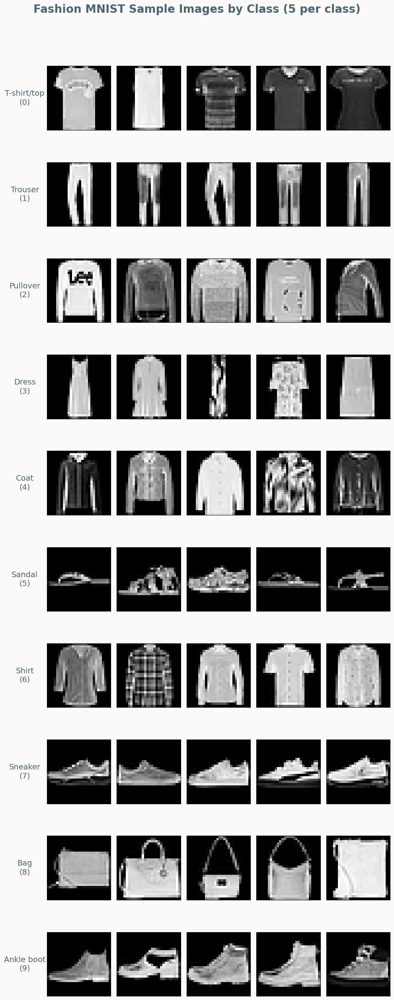

In [4]:
# === 印出各類別的多張代表性原圖 ===
def show_sample_images_per_class(dataloader, num_samples=5):
    """從測試集中找出每個類別的多張圖片並顯示"""
    class_images = {i: [] for i in range(10)}
    
    for data, target in dataloader:
        for i in range(len(target)):
            lbl = target[i].item()
            if len(class_images[lbl]) < num_samples:
                class_images[lbl].append(data[i].squeeze().numpy())
                
        # 檢查是否所有類別都收集夠了
        if all(len(imgs) == num_samples for imgs in class_images.values()):
            break
            
    plt.figure(figsize=(2 * num_samples, 2.5 * 10), facecolor='#FCF9F9')
    plt.suptitle(f'Fashion MNIST Sample Images by Class ({num_samples} per class)', fontsize=20, fontweight='bold', color='#4A6670', y=1.02)
    
    for lbl in range(10):
        class_name = FASHION_LABELS.get(lbl, str(lbl))
        for col in range(num_samples):
            plt.subplot(10, num_samples, lbl * num_samples + col + 1)
            plt.imshow(class_images[lbl][col], cmap='gray')
            if col == 0:
                plt.ylabel(f"{class_name}\n({lbl})", fontsize=14, color='#4A6670', rotation=0, labelpad=40, va='center')
            plt.xticks([])
            plt.yticks([])
            
    plt.tight_layout()
    plt.show()

print("\n=== 顯示資料集中各類別的範例圖片 ===")
show_sample_images_per_class(test_dataloader, num_samples=5)


In [15]:
# 初始化計數器
total_per_class = {i: 0 for i in range(10)}
correct_per_class = {i: 0 for i in range(10)}

model.eval()
with torch.no_grad():
    for data, target in test_dataloader:
        data, target = data.to(device), target.to(device)
        output = model(data)
        pred = output.argmax(dim=1)
        
        # 計算各類別總數與預測正確數
        for l in range(10):
            total_per_class[l] += (target == l).sum().item()
            correct_per_class[l] += ((target == l) & (pred == target)).sum().item()
print("=== Fashion MNIST 測試集統計 ===")
for l in range(10):
    class_name = FASHION_LABELS.get(l, str(l))
    print(f"[{l}] {class_name:12s}: 總共 {total_per_class[l]} 張, 預測正確 {correct_per_class[l]} 張")

=== Fashion MNIST 測試集統計 ===
[0] T-shirt/top : 總共 1000 張, 預測正確 927 張
[1] Trouser     : 總共 1000 張, 預測正確 983 張
[2] Pullover    : 總共 1000 張, 預測正確 888 張
[3] Dress       : 總共 1000 張, 預測正確 922 張
[4] Coat        : 總共 1000 張, 預測正確 875 張
[5] Sandal      : 總共 1000 張, 預測正確 982 張
[6] Shirt       : 總共 1000 張, 預測正確 697 張
[7] Sneaker     : 總共 1000 張, 預測正確 980 張
[8] Bag         : 總共 1000 張, 預測正確 979 張
[9] Ankle boot  : 總共 1000 張, 預測正確 955 張


=== 開始執行 FGSM 攻擊 ===

--- Running FGSMAttack ---


/home/karla/miniconda3/envs/fgsm_mnist/lib/python3.10/site-packages/torch/nn/modules/dropout.py:176: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  return F.dropout2d(input, self.p, self.training, self.inplace)


Epsilon: 0.01	Attack Success Rate = 1724 / 9188 = 0.1876
Epsilon: 0.02	Attack Success Rate = 3007 / 9188 = 0.3273
Epsilon: 0.03	Attack Success Rate = 3872 / 9188 = 0.4214
Epsilon: 0.04	Attack Success Rate = 4569 / 9188 = 0.4973
Epsilon: 0.05	Attack Success Rate = 5137 / 9188 = 0.5591
Epsilon: 0.06	Attack Success Rate = 5649 / 9188 = 0.6148
Epsilon: 0.07	Attack Success Rate = 6133 / 9188 = 0.6675
Epsilon: 0.08	Attack Success Rate = 6515 / 9188 = 0.7091
Epsilon: 0.09	Attack Success Rate = 6827 / 9188 = 0.7430
Epsilon: 0.1	Attack Success Rate = 7049 / 9188 = 0.7672

=== 提取的 FGSM ASR 數據 ===
{0.01: 0.18763604701784936, 0.02: 0.32727470613844145, 0.03: 0.4214192424902046, 0.04: 0.4972790596430126, 0.05: 0.5590988245537658, 0.06: 0.6148236830648672, 0.07: 0.6675010883761427, 0.08: 0.7090770570309098, 0.09: 0.7430343926861123, 0.1: 0.7671963430561602}

=== 成功提取對比圖素材 ===
原預測: 9, 攻擊後預測: 7
原圖 shape: (28, 28), 對抗樣本圖 shape: (28, 28)


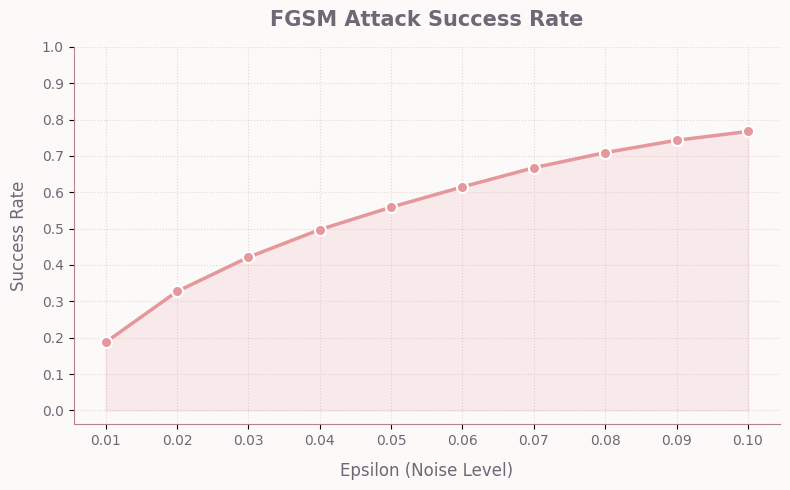

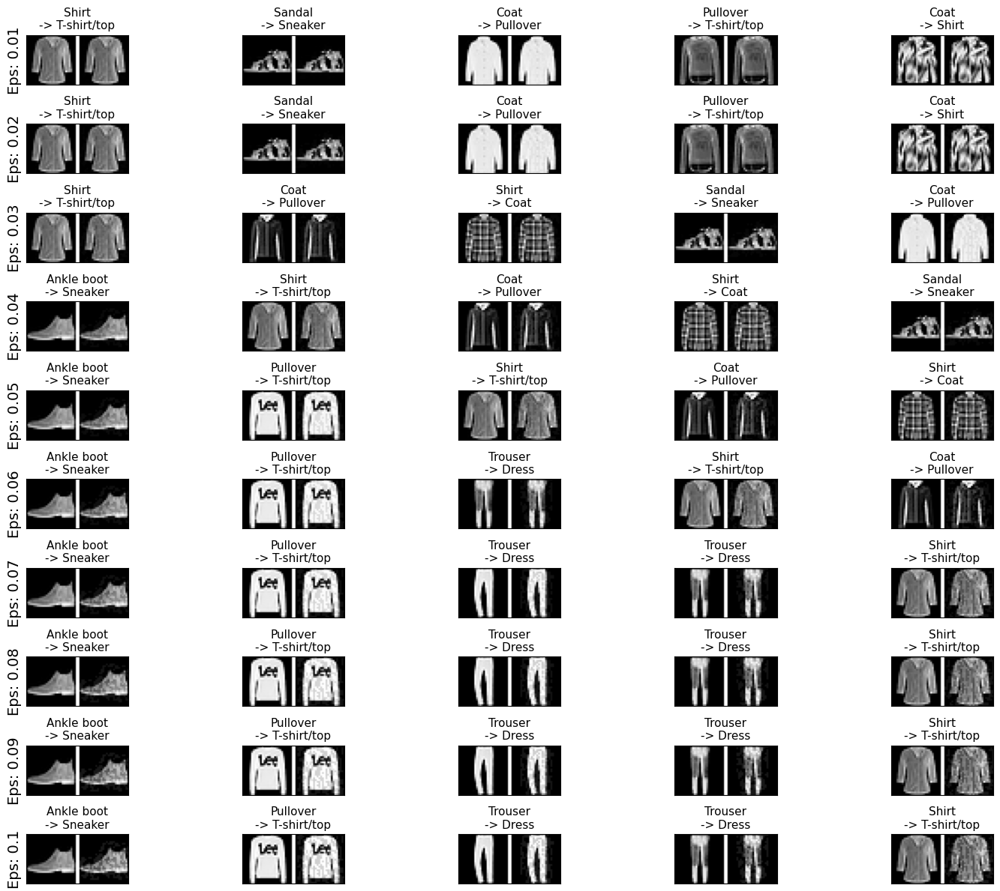

In [5]:
# --- 測試標準 FGSM 攻擊 ---
print("=== 開始執行 FGSM 攻擊 ===")
epsilons = [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]
fgsm_attack = run_attack(FGSMAttack, model, epsilons, test_dataloader, device)

# 1. 提取 ASR 數據 (供多模型圖表整合使用)
fgsm_asr_data = fgsm_attack.get_asr_data()
print("\n=== 提取的 FGSM ASR 數據 ===")
print(fgsm_asr_data)

# 2. 提取對比圖素材 (供報告使用)
example_images = fgsm_attack.get_example_images(epsilon=0.1, num_images=1)
if example_images:
    init_p, adv_p, orig_img, adv_img = example_images[0]
    print(f"\n=== 成功提取對比圖素材 ===")
    print(f"原預測: {init_p}, 攻擊後預測: {adv_p}")
    print(f"原圖 shape: {orig_img.shape}, 對抗樣本圖 shape: {adv_img.shape}")

# 3. 測試視覺化與存圖功能
visualize_results(fgsm_attack)

=== 開始執行 iFGSM 攻擊 ===

--- Running IFGSMAttack ---


/home/karla/miniconda3/envs/fgsm_mnist/lib/python3.10/site-packages/torch/nn/modules/dropout.py:176: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  return F.dropout2d(input, self.p, self.training, self.inplace)


Epsilon: 0.01	Iter: 10	Attack Success Rate = 1979 / 9188 = 0.2154
Epsilon: 0.02	Iter: 10	Attack Success Rate = 3918 / 9188 = 0.4264
Epsilon: 0.03	Iter: 10	Attack Success Rate = 5257 / 9188 = 0.5722
Epsilon: 0.04	Iter: 10	Attack Success Rate = 6385 / 9188 = 0.6949
Epsilon: 0.05	Iter: 10	Attack Success Rate = 7217 / 9188 = 0.7855
Epsilon: 0.06	Iter: 10	Attack Success Rate = 7858 / 9188 = 0.8552
Epsilon: 0.07	Iter: 10	Attack Success Rate = 8368 / 9188 = 0.9108
Epsilon: 0.08	Iter: 10	Attack Success Rate = 8688 / 9188 = 0.9456
Epsilon: 0.09	Iter: 10	Attack Success Rate = 8874 / 9188 = 0.9658
Epsilon: 0.1	Iter: 10	Attack Success Rate = 8978 / 9188 = 0.9771

=== iFGSM ASR 數據 ===
{0.01: 0.21538963865912059, 0.02: 0.4264257727470614, 0.03: 0.5721593382673051, 0.04: 0.6949281671745755, 0.05: 0.7854810622551154, 0.06: 0.8552459730082717, 0.07: 0.9107531562908141, 0.08: 0.9455811928602526, 0.09: 0.9658249891162386, 0.1: 0.977144101001306}


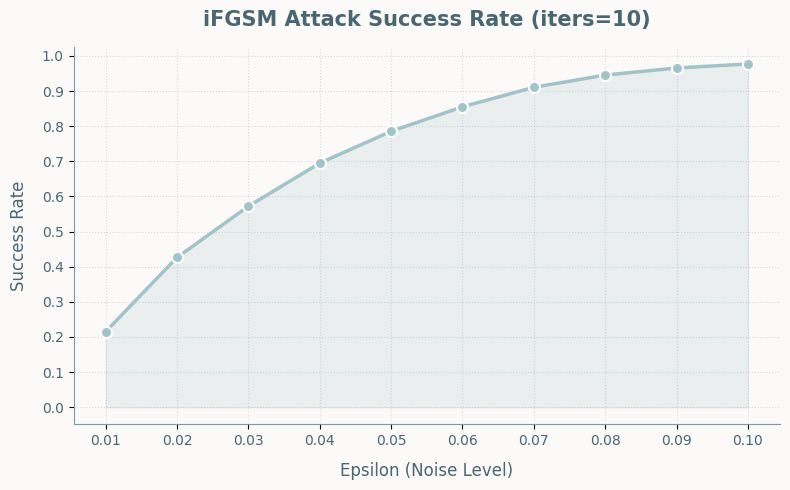

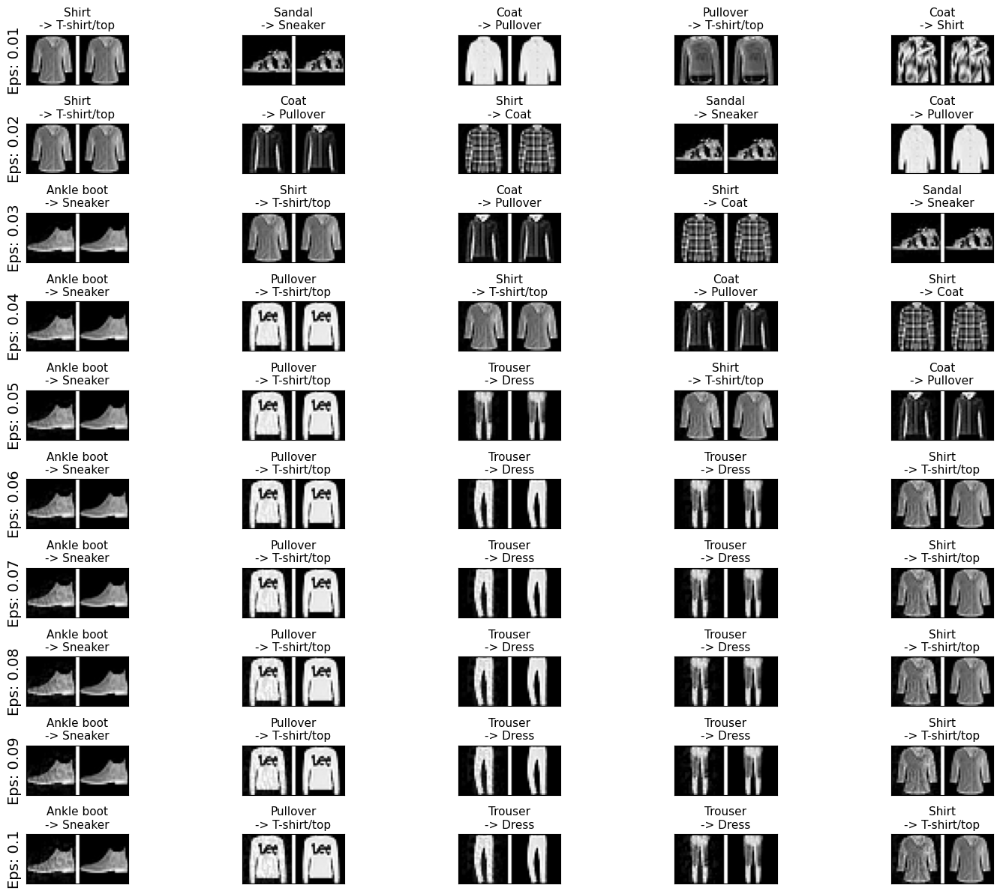

In [6]:
# --- 測試 iFGSM 攻擊 ---
print("=== 開始執行 iFGSM 攻擊 ===")
# 使用跟 FGSM 一樣的 epsilon，迭代次數設為 10
epsilons = [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]
ifgsm_attack = run_attack(IFGSMAttack, model, epsilons, test_dataloader, device, iters=10)

# 1. 提取 iFGSM ASR 數據
ifgsm_asr_data = ifgsm_attack.get_asr_data()
print("\n=== iFGSM ASR 數據 ===")
print(ifgsm_asr_data)

# 2. 測試視覺化與存圖功能
visualize_results(ifgsm_attack)

=== 開始執行 C&W 攻擊 ===

--- Running CWAttack ---


/home/karla/miniconda3/envs/fgsm_mnist/lib/python3.10/site-packages/torch/nn/modules/dropout.py:176: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  return F.dropout2d(input, self.p, self.training, self.inplace)


Epsilon: 0.01	Iter: 50	Attack Success Rate = 2087 / 9188 = 0.2271
Epsilon: 0.02	Iter: 50	Attack Success Rate = 4478 / 9188 = 0.4874
Epsilon: 0.03	Iter: 50	Attack Success Rate = 6321 / 9188 = 0.6880
Epsilon: 0.04	Iter: 50	Attack Success Rate = 8018 / 9188 = 0.8727
Epsilon: 0.05	Iter: 50	Attack Success Rate = 9083 / 9188 = 0.9886
Epsilon: 0.06	Iter: 50	Attack Success Rate = 9183 / 9188 = 0.9995
Epsilon: 0.07	Iter: 50	Attack Success Rate = 9188 / 9188 = 1.0000
Epsilon: 0.08	Iter: 50	Attack Success Rate = 9188 / 9188 = 1.0000
Epsilon: 0.09	Iter: 50	Attack Success Rate = 9188 / 9188 = 1.0000
Epsilon: 0.1	Iter: 50	Attack Success Rate = 9188 / 9188 = 1.0000

=== C&W ASR 數據 ===
{0.01: 0.22714410100130605, 0.02: 0.48737483674357857, 0.03: 0.6879625598606879, 0.04: 0.8726599912929909, 0.05: 0.988572050500653, 0.06: 0.9994558119286026, 0.07: 1.0, 0.08: 1.0, 0.09: 1.0, 0.1: 1.0}


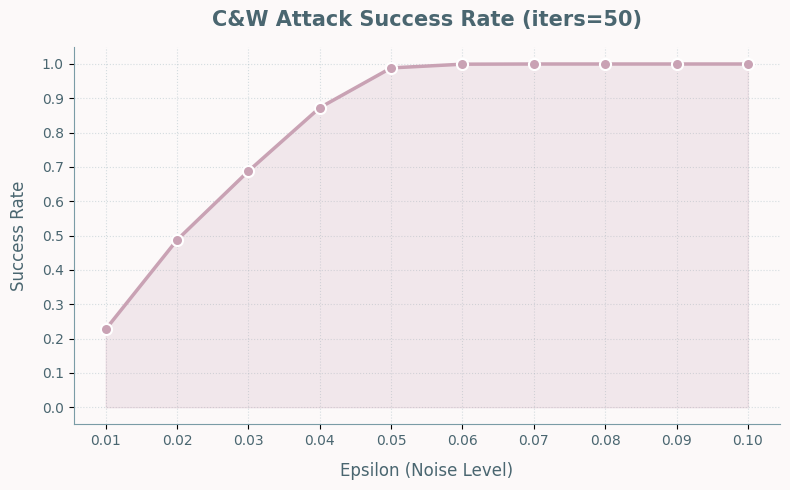

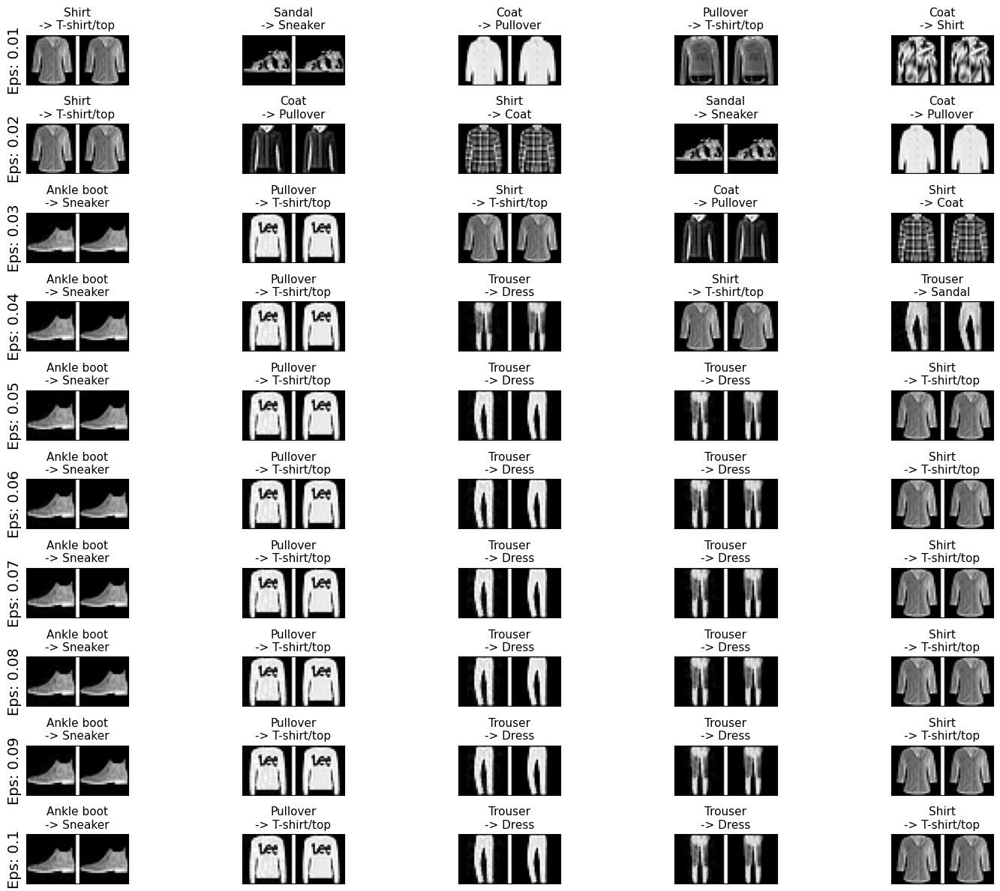

In [7]:
# --- 測試 C&W L_inf 攻擊 ---
print("=== 開始執行 C&W 攻擊 ===")
# 使用與前兩個攻擊相同的 epsilon
epsilons = [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]

# C&W 的迭代次數 (iters) 通常會比 iFGSM 多一點效果才會出來，這裡先設 50 步
cw_attack = run_attack(CWAttack, model, epsilons, test_dataloader, device, iters=50, lr=0.01)

# 1. 提取 C&W ASR 數據
cw_asr_data = cw_attack.get_asr_data()
print("\n=== C&W ASR 數據 ===")
print(cw_asr_data)

# 2. 測試視覺化與存圖功能
visualize_results(cw_attack)

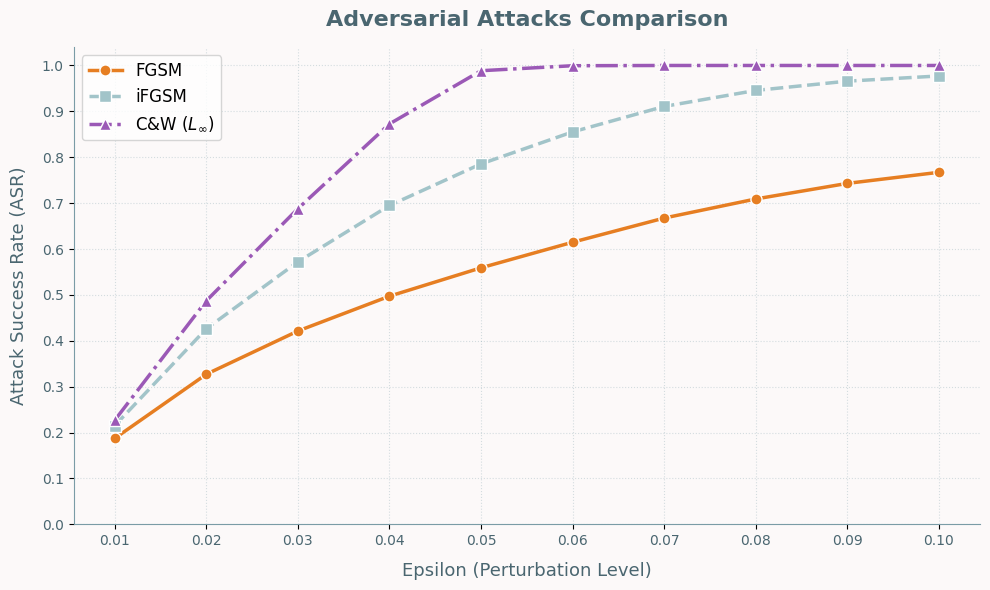

✅ 圖表已成功繪製並儲存至 ./0424/data/img/all_attacks_comparison.png


In [8]:
# 提取 Epsilon (X軸)
epsilons = list(fgsm_asr_data.keys())

# 提取 ASR (Y軸)
fgsm_asr = list(fgsm_asr_data.values())
ifgsm_asr = list(ifgsm_asr_data.values())
cw_asr = list(cw_asr_data.values())

# 繪製折線圖
plt.figure(figsize=(10, 6), facecolor='#FCF9F9')
ax = plt.gca()
ax.set_facecolor('#FCF9F9')
text_color = '#4A6670'

# FGSM 線 (橘紅色)
plt.plot(epsilons, fgsm_asr, marker="o", linestyle="-", label="FGSM",
         color="#E67E22", linewidth=2.5, markersize=8, markeredgecolor='white')
# iFGSM 線 (湖水藍)
plt.plot(epsilons, ifgsm_asr, marker="s", linestyle="--", label="iFGSM",
         color="#A2C4C9", linewidth=2.5, markersize=8, markeredgecolor='white')
# C&W 線 (紫色)
plt.plot(epsilons, cw_asr, marker="^", linestyle="-.", label="C&W ($L_{\infty}$)",
         color="#9B59B6", linewidth=2.5, markersize=8, markeredgecolor='white')

# 標題與軸標籤
plt.title("Adversarial Attacks Comparison", fontsize=16, fontweight='bold', color=text_color, pad=15)
plt.xlabel("Epsilon (Perturbation Level)", fontsize=13, color=text_color, labelpad=10)
plt.ylabel("Attack Success Rate (ASR)", fontsize=13, color=text_color, labelpad=10)

# 軸刻度與網格
plt.xticks(epsilons, color=text_color)
plt.yticks([i / 10.0 for i in range(11)], color=text_color)
plt.grid(True, linestyle=":", color="#7A9CA6", alpha=0.3, zorder=1)
plt.legend(fontsize=12)

# 去除邊框
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#7A9CA6')
ax.spines['bottom'].set_color('#7A9CA6')

# 存檔與顯示
plt.tight_layout()
plt.savefig("./all_attacks_comparison.png", dpi=300, facecolor='#FCF9F9')
plt.show()

print("✅ 圖表已成功繪製並儲存至 ./0424/data/img/all_attacks_comparison.png")

/home/karla/miniconda3/envs/fgsm_mnist/lib/python3.10/site-packages/torch/nn/modules/dropout.py:176: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  return F.dropout2d(input, self.p, self.training, self.inplace)


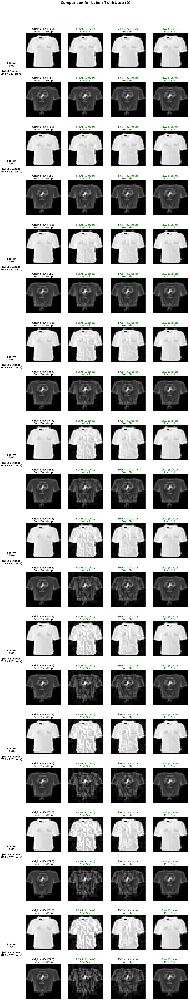

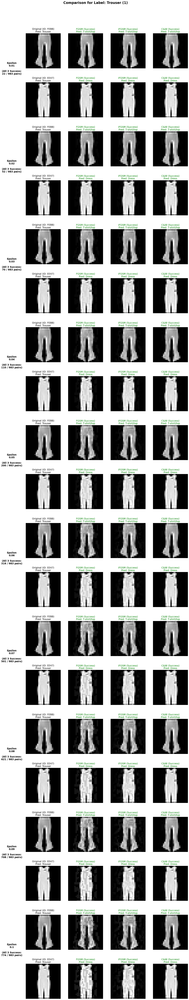

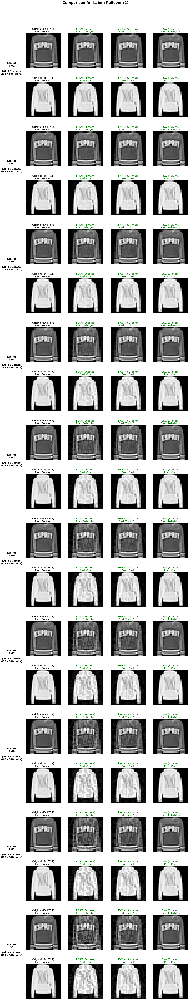

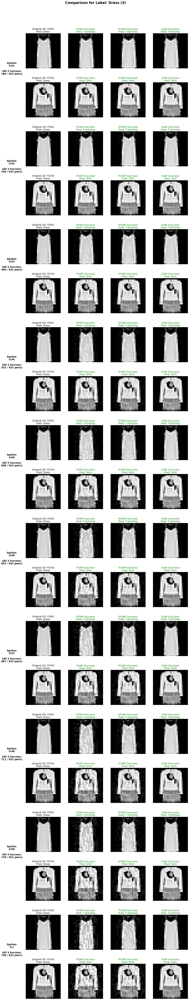

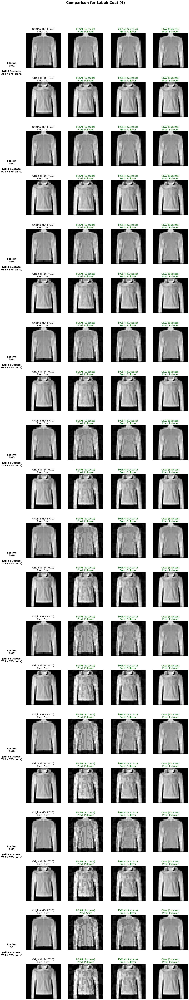

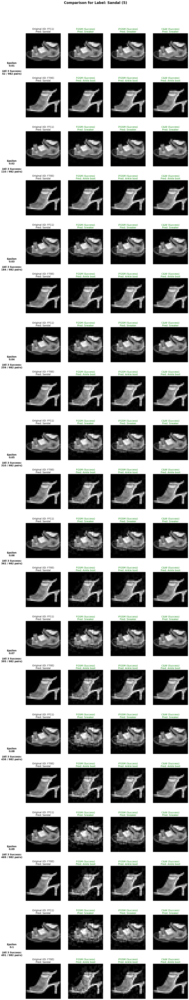

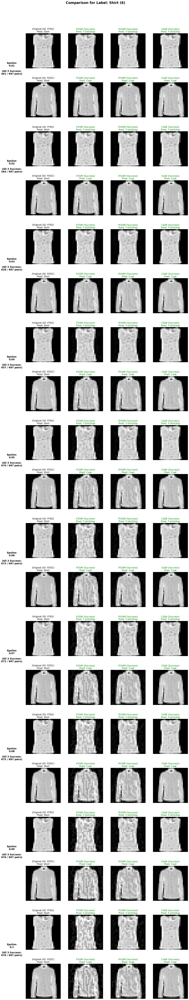

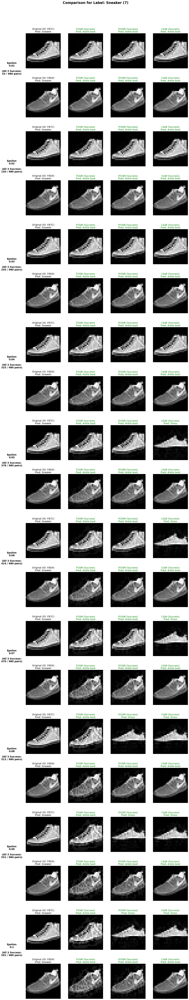

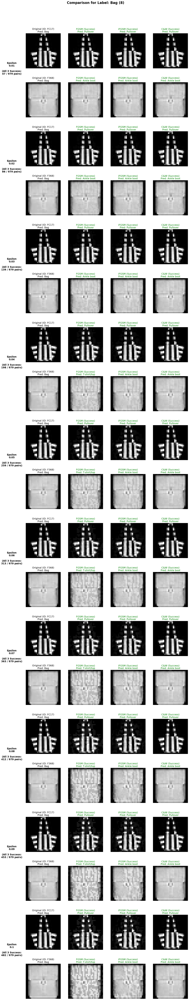

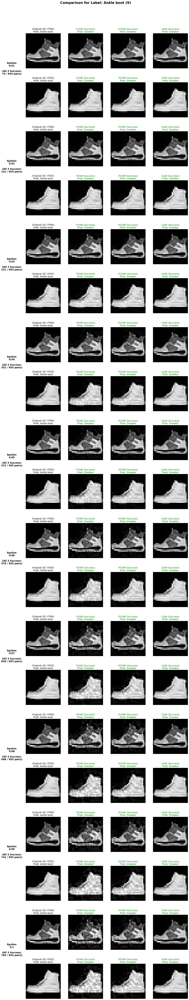

In [22]:
# 建立 Fashion MNIST 的標籤對應表
FASHION_LABELS = {
    0: 'T-shirt/top',
    1: 'Trouser',
    2: 'Pullover',
    3: 'Dress',
    4: 'Coat',
    5: 'Sandal',
    6: 'Shirt',
    7: 'Sneaker',
    8: 'Bag',
    9: 'Ankle boot'
}

def get_image_id(img):
    """
    利用圖片像素內容產生一組簡短的唯一編號。
    為了避免浮點數的微小誤差造成誤判，先轉換為 uint8  再進行 hash。
    """
    img_array = (np.array(img).squeeze() * 255).astype(np.uint8)
    return hashlib.md5(img_array.tobytes()).hexdigest()[:4].upper()

def plot_all_epsilons_by_label(fgsm_attack, ifgsm_attack, cw_attack, model, test_dataloader, device, 
                               epsilons=[0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09,0.1], 
                               labels=range(10)):
    # 預先計算各類別在未受攻擊前，模型就預測正確的樣本數量
    correct_per_class = {i: 0 for i in labels}
    model.eval()
    with torch.no_grad():
        for data, target in test_dataloader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            pred = output.argmax(dim=1)
            correct_mask = (pred == target)
            for l in labels:
                correct_per_class[l] += ((target == l) & correct_mask).sum().item()

    # 遍歷每一個 label (0 ~ 9)
    for label in labels:
        total_correct = correct_per_class[label]
        class_name = FASHION_LABELS.get(label, str(label))
        
        # 收集所有 epsilon 下的攻擊結果，並以 img_id 為鍵進行全域統計
        global_img_dict = {}
        eps_3_success_counts = {}
        
        for eps in epsilons:
            fgsm_exs = fgsm_attack.get_example_images(epsilon=eps, num_images=10000)
            ifgsm_exs = ifgsm_attack.get_example_images(epsilon=eps, num_images=10000)
            cw_exs = cw_attack.get_example_images(epsilon=eps, num_images=10000)
            
            fgsm_cands = [ex for ex in (fgsm_exs or []) if ex[0] == label]
            ifgsm_cands = [ex for ex in (ifgsm_exs or []) if ex[0] == label]
            cw_cands = [ex for ex in (cw_exs or []) if ex[0] == label]
            
            eps_img_dict = {}
            def add_to_dict(cands, attack_name):
                for ex in cands:
                    orig_img = np.array(ex[2])
                    img_id = get_image_id(orig_img)
                    
                    if img_id not in eps_img_dict:
                        eps_img_dict[img_id] = set()
                    eps_img_dict[img_id].add(attack_name)
                    
                    if img_id not in global_img_dict:
                        global_img_dict[img_id] = {'orig': orig_img, 'init_p': ex[0], 'attacks': {}}
                    if eps not in global_img_dict[img_id]['attacks']:
                        global_img_dict[img_id]['attacks'][eps] = {}
                    global_img_dict[img_id]['attacks'][eps][attack_name] = ex
                    
            add_to_dict(fgsm_cands, 'FGSM')
            add_to_dict(ifgsm_cands, 'iFGSM')
            add_to_dict(cw_cands, 'C&W')
            
            eps_3_success_counts[eps] = sum(1 for v in eps_img_dict.values() if len(v) == 3)
            
        # 選出 2 個最佳的 img_id
        # 評分標準：在各個 epsilon 和各種攻擊中成功的總次數 (最高 15)
        scored_ids = []
        for img_id, info in global_img_dict.items():
            score = sum(len(atk_dict) for eps, atk_dict in info['attacks'].items())
            scored_ids.append((score, img_id))
            
        scored_ids.sort(key=lambda x: (x[0], x[1]), reverse=True)
        top_2_ids = [x[1] for x in scored_ids[:2]]
        
        if not top_2_ids:
            print(f"Label {class_name} ({label}) has no successful attacks at all.")
            continue
            
        # 建立畫布 (10 列 x 4 欄)
        nrows = len(epsilons) * len(top_2_ids) 
        fig, axes = plt.subplots(nrows, 4, figsize=(16, 4 * nrows), squeeze=False)
        fig.suptitle(f"Comparison for Label: {class_name} ({label})", fontsize=20, fontweight='bold', y=1.02)
        
        row_idx = 0
        for eps in epsilons:
            for i, img_id in enumerate(top_2_ids):
                eps_3_success_count = eps_3_success_counts[eps]
                
                if i == 0:
                    y_pos = 0.0 if len(top_2_ids) > 1 else 0.5
                    axes[row_idx][0].text(-0.4, y_pos, f"Epsilon\n{eps}\n\n(All 3 Success:\n{eps_3_success_count} / {total_correct} pairs)", 
                        va='center', ha='center', 
                        transform=axes[row_idx][0].transAxes, 
                        fontsize=14, fontweight='bold')
                
                if img_id not in global_img_dict:
                    for j in range(4):
                        axes[row_idx][j].axis('off')
                        if j == 0:
                            axes[row_idx][j].text(0.5, 0.5, 'No image found', ha='center', va='center', fontsize=14, color='gray')
                    row_idx += 1
                    continue
                    
                info = global_img_dict[img_id]
                init_p = info['init_p']
                orig_img = info['orig']
                attacks_at_eps = info['attacks'].get(eps, {})
                init_name = FASHION_LABELS.get(init_p, str(init_p))
                
                axes[row_idx][0].imshow(orig_img.squeeze(), cmap='gray')
                axes[row_idx][0].set_title(f"Original (ID: {img_id})\nPred: {init_name}", fontsize=14)
                axes[row_idx][0].axis('off')
                
                attack_names = ['FGSM', 'iFGSM', 'C&W']
                for j, atk_name in enumerate(attack_names):
                    ax = axes[row_idx][j+1]
                    if atk_name in attacks_at_eps:
                        ex = attacks_at_eps[atk_name]
                        adv_p = ex[1]
                        adv_img = np.array(ex[3]).squeeze()
                        adv_name = FASHION_LABELS.get(adv_p, str(adv_p))
                        
                        ax.imshow(adv_img, cmap='gray')
                        ax.set_title(f"{atk_name} (Success)\nPred: {adv_name}", fontsize=14, color='green')
                    else:
                        ax.imshow(orig_img.squeeze(), cmap='gray')
                        ax.set_title(f"{atk_name} (Failed)\nPred: {init_name}", fontsize=14, color='red')
                    ax.axis('off')
                    
                row_idx += 1
                
        plt.tight_layout()
        plt.show()

# 執行函式
plot_all_epsilons_by_label(fgsm_attack, ifgsm_attack, cw_attack, model, test_dataloader, device)


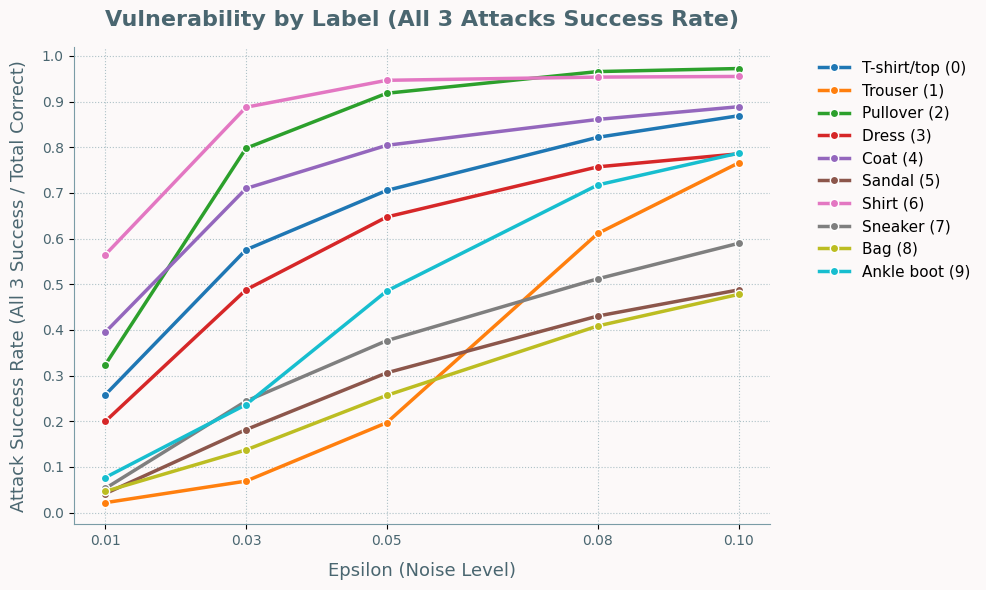

In [20]:
# === 繪製各個 Label 在不同 Epsilon 下「三種攻擊皆成功」的比例變化折線圖 ===
def plot_all_3_success_trend(fgsm_attack, ifgsm_attack, cw_attack,
                             model, test_dataloader, device, 
                             epsilons=[0.01, 0.03, 0.05, 0.08, 0.1], 
                             labels=range(10)):
    
    # 預先計算各類別在未受攻擊前，模型就預測正確的樣本數量 (作為分母)
    correct_per_class = {i: 0 for i in labels}
    model.eval()
    with torch.no_grad():
        for data, target in test_dataloader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            pred = output.argmax(dim=1)
            correct_mask = (pred == target)
            for l in labels:
                correct_per_class[l] += ((target == l) & correct_mask).sum().item()
    
    for l in labels:
       correct_per_class[l] += ((target == l) &
    correct_mask).sum().item()
    stats = {lbl: [] for lbl in labels}
    
    for eps in epsilons:
        # 取得當前 eps 的所有對抗樣本 (上限 10000 確保涵蓋全部)
        fgsm_exs = fgsm_attack.get_example_images(epsilon=eps, num_images=10000)
        ifgsm_exs = ifgsm_attack.get_example_images(epsilon=eps, num_images=10000)
        cw_exs = cw_attack.get_example_images(epsilon=eps, num_images=10000)
        
        for label in labels:
            fgsm_cands = [ex for ex in (fgsm_exs or []) if ex[0] == label]
            ifgsm_cands = [ex for ex in (ifgsm_exs or []) if ex[0] == label]
            cw_cands = [ex for ex in (cw_exs or []) if ex[0] == label]
            
            img_dict = {}
            def add_to_dict(cands, attack_name):
                for ex in cands:
                    orig_img = np.array(ex[2])
                    # 使用 hash 確保是同一張原圖
                    img_id = hashlib.md5((orig_img * 255).astype(np.uint8).tobytes()).hexdigest()[:6]
                    if img_id not in img_dict:
                        img_dict[img_id] = set()
                    img_dict[img_id].add(attack_name)
                    
            add_to_dict(fgsm_cands, 'FGSM')
            add_to_dict(ifgsm_cands, 'iFGSM')
            add_to_dict(cw_cands, 'C&W')
            
            # 計算 3 種攻擊都同時成功的圖片數量 (分子)
            all_3_count = sum(1 for v in img_dict.values() if len(v) == 3)
            
            # 轉換為百分比 (比例: 所有三種皆成功 / 原本正確預測數量)
            total_correct = correct_per_class[label]
            ratio = all_3_count / total_correct if total_correct > 0 else 0
            stats[label].append(ratio)
            
    # 開始繪圖
    plt.figure(figsize=(10, 6), facecolor='#FCF9F9')
    ax = plt.gca()
    ax.set_facecolor('#FCF9F9')
    
    # 取得 10 種不同的顏色，讓 10 條線有較高辨識度
    colors = cm.tab10(np.linspace(0, 1, 10))
    
    for label in labels:
        class_name = FASHION_LABELS.get(label, str(label))
        plt.plot(epsilons, stats[label], marker='o', label=f'{class_name} ({label})', 
                 color=colors[label], linewidth=2.5, markersize=6, markeredgecolor='white')
                 
    plt.title('Vulnerability by Label (All 3 Attacks Success Rate)', fontsize=16, fontweight='bold', color='#4A6670', pad=15)
    plt.xlabel('Epsilon (Noise Level)', fontsize=13, color='#4A6670', labelpad=10)
    plt.ylabel('Attack Success Rate (All 3 Success / Total Correct)', fontsize=13, color='#4A6670', labelpad=10)
    
    plt.xticks(epsilons, color='#4A6670')
    # 設定 Y 軸為 0.0 ~ 1.0 的比例
    plt.yticks(np.arange(0.0, 1.1, 0.1), color='#4A6670')
    plt.grid(True, linestyle=':', alpha=0.6, color='#7A9CA6')
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color('#7A9CA6')
    ax.spines['bottom'].set_color('#7A9CA6')
    
    # 將圖例放到右側圖表外面，避免遮擋折線
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=11, frameon=False)
    
    plt.tight_layout()
    plt.savefig('./all_3_success_trend_by_label.png', dpi=1200, facecolor='#FCF9F9')
    plt.show()

# 執行函式 (記得現在需要多傳入 model, test_dataloader, device)
plot_all_3_success_trend(fgsm_attack, ifgsm_attack, cw_attack, model, test_dataloader, device)


--- Running SparseFGSMAttack ---


/home/karla/miniconda3/envs/fgsm_mnist/lib/python3.10/site-packages/torch/nn/modules/dropout.py:176: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  return F.dropout2d(input, self.p, self.training, self.inplace)


Epsilon: 0.01	Attack Success Rate = 150 / 9188 = 0.0163
Epsilon: 0.03	Attack Success Rate = 450 / 9188 = 0.0490
Epsilon: 0.05	Attack Success Rate = 701 / 9188 = 0.0763
Epsilon: 0.08	Attack Success Rate = 1026 / 9188 = 0.1117
Epsilon: 0.1	Attack Success Rate = 1207 / 9188 = 0.1314
Epsilon: 0.2	Attack Success Rate = 1801 / 9188 = 0.1960
Epsilon: 0.3	Attack Success Rate = 2099 / 9188 = 0.2285
Epsilon: 0.5	Attack Success Rate = 2389 / 9188 = 0.2600


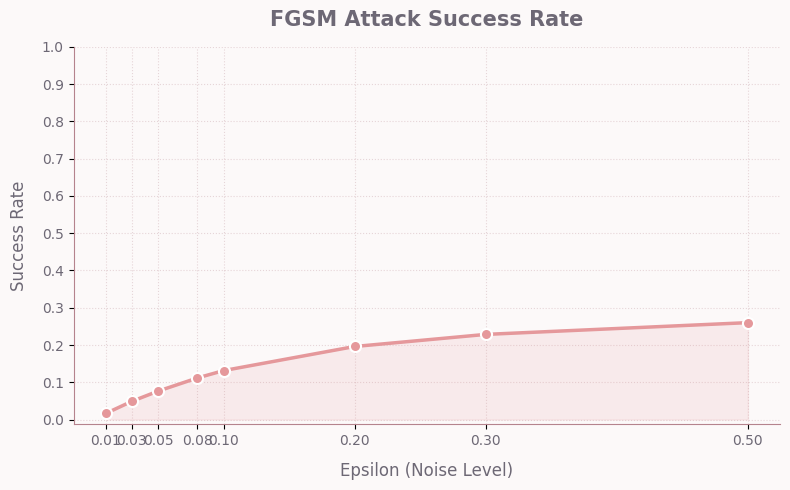

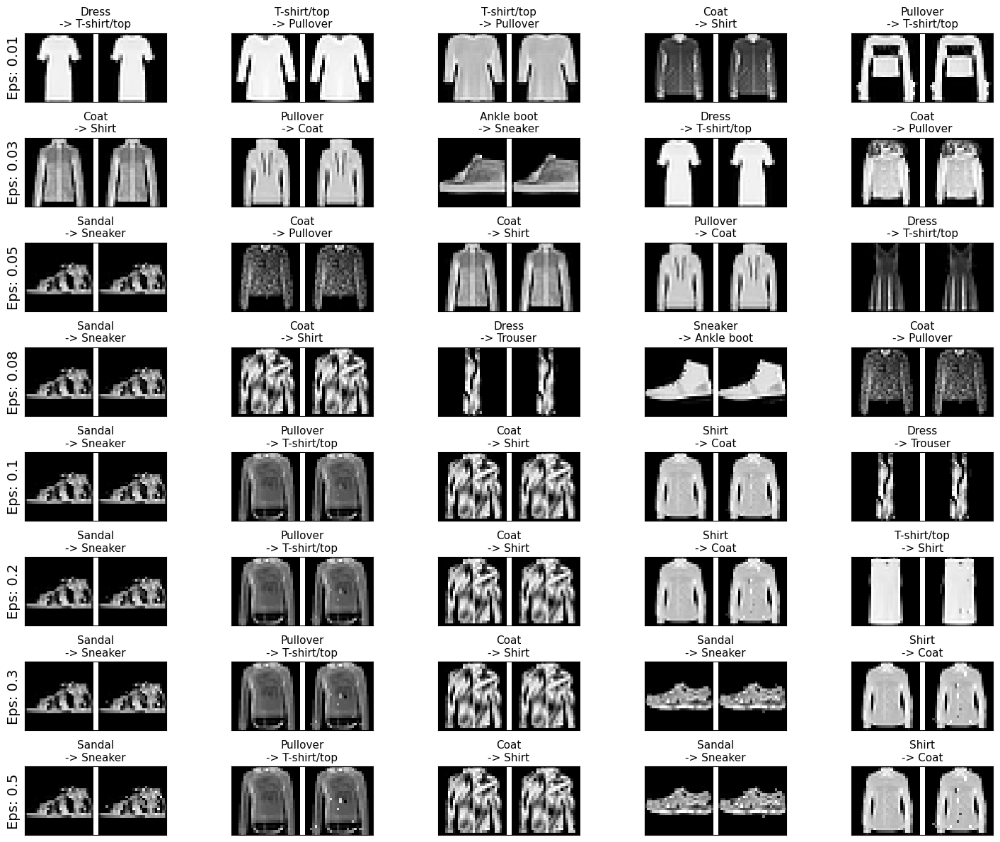

In [ ]:
# 執行 Sparse FGSM 攻擊
sparse_epsilons = [0.01, 0.03, 0.05, 0.08, 0.1, 0.2, 0.3, 0.5]
max_pixels = 15
sparse_attack = run_attack(SparseFGSMAttack, model, sparse_epsilons, test_dataloader, device, max_pixels=max_pixels)
visualize_results(sparse_attack)

In [ ]:
print("\n========== 對抗性微調 (Adversarial Fine-tuning) ==========")
if hasattr(fgsm_attack, 'retrain_images') and len(fgsm_attack.retrain_images) > 0:
    print(f"🚩 正在處理 {len(fgsm_attack.retrain_images)} 筆對抗樣本...")
    adv_images = torch.cat(fgsm_attack.retrain_images, dim=0)
    adv_labels = torch.cat(fgsm_attack.retrain_labels, dim=0)
    retrain_dataset = TensorDataset(adv_images, adv_labels)
    retrain_loader = DataLoader(retrain_dataset, batch_size=32, shuffle=True)

    model.train()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    criterion = nn.CrossEntropyLoss()

    epochs = 5
    for epoch in range(epochs):
        current_loss = 0.0
        for images, labels in retrain_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            current_loss += loss.item()
        print(f"Epoch {epoch+1}/{epochs}, Loss: {current_loss/len(retrain_loader):.4f}")
    print("✅ 對抗性微調完成！")
else:
    print("❌ 找不到誤判樣本。")



========== 對抗性微調 (Adversarial Fine-tuning) ==========
🚩 正在處理 24297 筆對抗樣本...


/home/karla/miniconda3/envs/fgsm_mnist/lib/python3.10/site-packages/torch/nn/modules/dropout.py:176: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  return F.dropout2d(input, self.p, self.training, self.inplace)


Epoch 1/5, Loss: 6.6377
Epoch 2/5, Loss: 1.8195
Epoch 3/5, Loss: 1.3722
Epoch 4/5, Loss: 1.0965
Epoch 5/5, Loss: 0.9137
✅ 對抗性微調完成！



=== 評估微調後的新模型 (FGSM) ===

--- Running FGSMAttack ---
Epsilon: 0.01	Attack Success Rate = 877 / 8411 = 0.1043
Epsilon: 0.03	Attack Success Rate = 2217 / 8411 = 0.2636
Epsilon: 0.05	Attack Success Rate = 3263 / 8411 = 0.3879
Epsilon: 0.08	Attack Success Rate = 4205 / 8411 = 0.4999
Epsilon: 0.1	Attack Success Rate = 4634 / 8411 = 0.5509


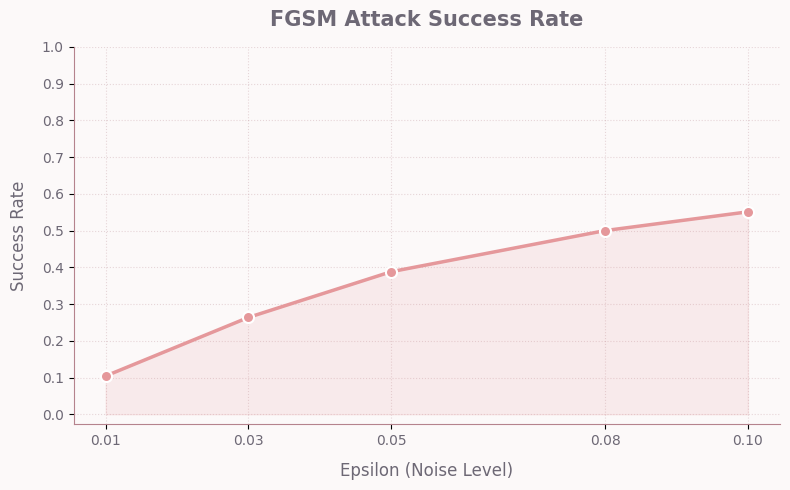

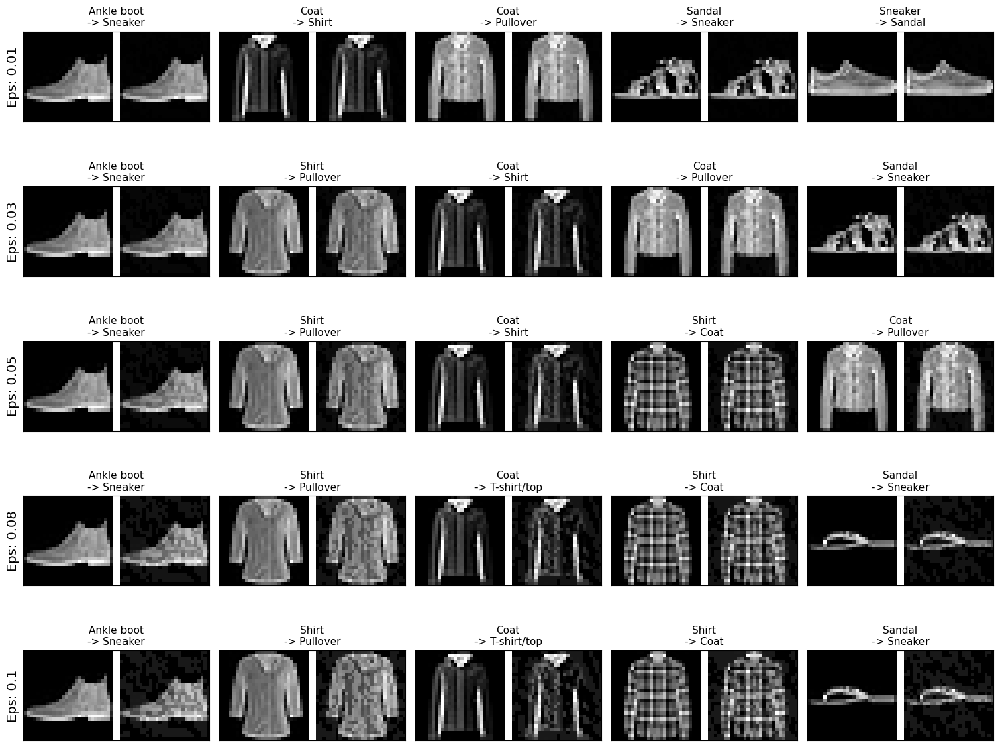

In [ ]:
print("\n=== 評估微調後的新模型 (FGSM) ===")
model.eval()
new_fgsm_attack = run_attack(FGSMAttack, model, epsilons, test_dataloader, device)
visualize_results(new_fgsm_attack)